# Stacked Carton Dataset: Create train_df to fine-tune Florence-2 model

In the previous Colab notebook [0_SCD_download_explore.ipynb](https://github.com/aguille-vert/florence-2-scd/blob/main/notebooks/0_SCD_download_explore.ipynb) we downloaded and explored SCD. Now we are going to use some of the downloaded images to create dataset to fine-tune Florence-2 model  

* Original paper: [Florence-2: Advancing a Unified Representation for a Variety of Vision Tasks](https://arxiv.org/abs/2311.06242)
* Huggingface blog post [Fine-tuning Florence-2 - Microsoft's Cutting-edge Vision Language Models](https://huggingface.co/blog/finetune-florence2)  
* [Jupyter Notebook for inference and visualization of Florence-2-large model](https://huggingface.co/microsoft/Florence-2-large/blob/main/sample_inference.ipynb)
* Roboflow NB [Fine-tuning Florence-2 on Object Detection Dataset](https://colab.research.google.com/github/roboflow-ai/notebooks/blob/main/notebooks/how-to-finetune-florence-2-on-detection-dataset.ipynb?ref=blog.roboflow.com)

Florence-2 is an advanced vision foundation model that uses a prompt-based approach to handle a wide range of vision and vision-language tasks. Florence-2 can interpret simple text prompts to perform tasks like captioning, object detection, and segmentation. It leverages our FLD-5B dataset, containing 5.4 billion annotations across 126 million images, to master multi-task learning. The model's sequence-to-sequence architecture enables it to excel in both zero-shot and fine-tuned settings, proving to be a competitive vision foundation model.  

When fine-tuning the model, Florence-2 processor shall be used to process images and bboxes into the prompt format expected by the model:

* CHECKPOINT = "microsoft/Florence-2-base-ft"
* REVISION = 'refs/pr/6'
* processor = AutoProcessor.from_pretrained(CHECKPOINT, trust_remote_code=True, revision=REVISION)

* bbox format expected by the processor:  
(xmin, ymin, xmax, ymax)


# Setup

In [86]:
!pip install jsonlines
from IPython.display import clear_output
clear_output()
import jsonlines

In [ ]:
import os
import pandas as pd
import cv2
import numpy as np
import zipfile
import json
from PIL import Image
from io import BytesIO
import matplotlib.pyplot as plt

In [ ]:
# from google.colab import drive
# drive.mount('/content/drive')

In [ ]:
path = '/content/drive/MyDrive/0_Projects/drone-warehouse/'
os.chdir(path)

# Create train_df

## select images
there are 3 sub-sets of SCD images:
* OSCD
* LSCD
* LSCD occlusions

above subsets have train and val variations  
We are going to take a sample of 2000 images from LSCD images and split it into:
* train_df
* test_df
* val_df

## LSCD
bbox column contains bboxes in the format :
(x1,y1, width, height)  

Florence-2 processor expects bboxes in the format:  
(xmin, ymin, xmax,ymax)  

We need to provide bbxes in the format expected by the processor  

Florence-2 expects images size 640x640
we need to resize images and adjust bboxes accordingly

In [ ]:
zip_file_path = './images/LSCD.zip'
with zipfile.ZipFile(zip_file_path, 'r') as zip_ref:
    # Extract the list of filenames
    lscd_filenames = zip_ref.namelist()

lscd_fn_df = pd.DataFrame(lscd_filenames,
                          columns = ['file_name'])
lscd_fn_df.shape

(7741, 1)

In [ ]:
file_name = 'annotations/instances_train2017.json'
zip_file_path = './images/LSCD.zip'
with zipfile.ZipFile(zip_file_path, 'r') as zip_ref:
    with zip_ref.open(file_name) as file:
        file_content = file.read()
        file_text = file_content.decode('utf-8')

json_data = json.loads(file_text)


lscd_image_train_df = pd.DataFrame(json_data['images'])
lscd_annot_train_df = pd.DataFrame(json_data['annotations'])

lscd_image_train_df.shape, lscd_annot_train_df.shape

((6735, 4), (70838, 7))

In [ ]:
lscd_image_train_df.rename(columns={'id' : 'image_id'}, inplace=True)
lscd_image_train_df = lscd_image_train_df.merge(lscd_annot_train_df[['image_id',
                                                        'segmentation',
                                                                     'bbox']],
                    on='image_id')
lscd_image_train_df.shape

(70838, 6)

In [ ]:
lscd_image_train_df.head()

,height,width,image_id,file_name,segmentation,bbox
0,3680,2728,0,2850.jpg,"[[90.82352941176464, 3184.3529411764703, 1467....","[90.82352941176464, 3125.529411764706, 1376.47..."
1,3680,2728,0,2850.jpg,"[[1467.2941176470586, 3125.529411764706, 2331....","[1467.2941176470586, 3096.1176470588234, 864.7..."
2,3680,2728,0,2850.jpg,"[[2331.9999999999995, 3096.1176470588234, 2727...","[2302.5882352941176, 3070.0, 424.4117647058824..."
3,3680,2728,0,2850.jpg,"[[967.2941176470586, 2684.3529411764703, 2320....","[961.411764705882, 2654.941176470588, 1370.588..."
4,3680,2728,0,2850.jpg,"[[20.235294117646845, 2696.1176470588234, 967....","[20.235294117646845, 2678.470588235294, 947.05..."


In [ ]:
lscd_image_train_df.image_id.nunique()

6733

### visualize image

In [ ]:
image_ids = list(lscd_image_train_df['image_id'].unique())
print(len(image_ids))

6733


this is an original image without segments:

images/train2017/3356.jpg


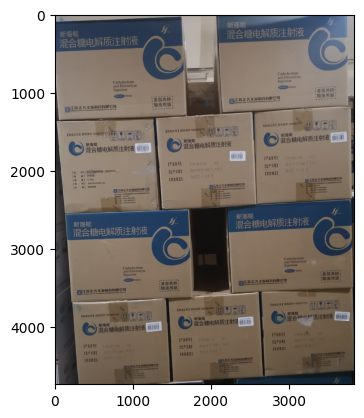

In [ ]:
n = 19
image_id = image_ids[n]
image_df = lscd_image_train_df.query("image_id==@image_id")

image_suffix = image_df.iloc[1,3]
img_fn = f"images/train2017/{image_suffix}"
print(img_fn)

with zipfile.ZipFile(zip_file_path, 'r') as zip_ref:
  with zip_ref.open(img_fn) as file:
    file_content = file.read()
    image = Image.open(BytesIO(file_content))
plt.imshow(image);

let's draw segments on the image using 'segmentation' column

In [ ]:
def convert_to_numpy_array(coordinates_list):
    # Convert the list to a NumPy array
    coordinates_array = np.array(coordinates_list)

    # Reshape the array to separate x and y coordinates
    reshaped_array = coordinates_array.reshape(-1, 2)

    # Convert the coordinates to integers
    integer_array = reshaped_array.astype(np.int32)

    # Further reshape to the desired output format
    final_array = integer_array.reshape(len(coordinates_list), -1, 2)

    return final_array
def convert_to_polygon_array(coordinates_list):
    # Convert the list to a NumPy array
    coordinates_array = np.array(coordinates_list)

    # Reshape the array to separate x and y coordinates and ensure each coordinate pair is represented properly
    reshaped_array = coordinates_array.reshape(len(coordinates_list), -1, 2)

    # Convert the coordinates to integers
    integer_array = reshaped_array.astype(np.int32)

    return integer_array

def convert_to_polygon_array(coordinates_list):
    polygons = []
    for coordinates in coordinates_list:
        # Convert the list to a NumPy array and reshape it to separate x and y coordinates
        coordinates_array = np.array(coordinates).reshape(-1, 2)

        # Convert the coordinates to integers
        integer_array = coordinates_array.astype(np.int32)

        polygons.append(integer_array)

    return polygons

def draw_polygons(image_path, polygons, output_path=None):
    # Load the image
    image = cv2.imread(image_path)

    # Loop through the list of polygons and draw each one on the image
    for polygon in polygons:
        # Draw the polygon by connecting each point
        cv2.polylines(image, [polygon], isClosed=True, color=(0, 255, 0), thickness=2)

    # Display the image with polygons (optional)
    cv2.imshow('Image with Polygons', image)
    cv2.waitKey(0)  # Wait for a key press to close the window
    cv2.destroyAllWindows()

    # Save the image with polygons if an output path is provided (optional)
    if output_path:
        cv2.imwrite(output_path, image)

In [ ]:
segments = image_df['segmentation'].tolist()
print(len(segments))
polygons = convert_to_polygon_array(segments)
print(len(polygons))

In [ ]:
polygons

In [ ]:
polygons

In [ ]:
numpy_image = np.array(image)
numpy_image = cv2.cvtColor(numpy_image, cv2.COLOR_RGB2BGR)
for polygon in polygons:
        # Draw the polygon by connecting each point
        cv2.polylines(numpy_image, [polygon],
                      isClosed=True,
                      color=(0, 255, 0),
                      thickness=2)
plt.imshow(numpy_image);

In [ ]:
def convert_polygons_to_bboxes(polygons):
    bboxes = []
    for polygon in polygons:
        # Reshape the polygon to separate x and y coordinates
        coordinates_array = np.array(polygon).reshape(-1, 2)

        # Extract x and y coordinates
        x_coords = coordinates_array[:, 0]
        y_coords = coordinates_array[:, 1]

        # Calculate the bounding box coordinates
        x_min = int(np.min(x_coords))
        y_min = int(np.min(y_coords))
        x_max = int(np.max(x_coords))
        y_max = int(np.max(y_coords))

        # Form the bounding box as [x_min, y_min, x_max, y_max]
        bbox = [x_min, y_min, x_max, y_max]
        bboxes.append(bbox)

    return bboxes

In [ ]:
bboxes = convert_polygons_to_bboxes(polygons)
len(bboxes)

In [ ]:
numpy_image = np.array(image)
numpy_image = cv2.cvtColor(numpy_image, cv2.COLOR_RGB2BGR)
for bbox in bboxes:
        x1, y1, x2, y2 = bbox
        cv2.rectangle(numpy_image, (x1, y1), (x2, y2), (0, 255, 0), 2)
        break
plt.imshow(numpy_image)

In [ ]:
numpy_image = np.array(image)
numpy_image = cv2.cvtColor(numpy_image, cv2.COLOR_RGB2BGR)
bboxes = image_df['bbox'].apply(lambda x: [int(x[0]),
                                           int(x[1]),
                                           int(x[0]+x[2]),
                                           int(x[1]+x[3])]).tolist()
for bbox in bboxes:
        x1, y1, x2, y2 = bbox
        cv2.rectangle(numpy_image, (x1, y1), (x2, y2), (0, 255, 0), 2)
plt.imshow(numpy_image)

### create train ds - bboxes
bboxes are less accurate than polygons, but they need only 4 coordinates, whereas polygons can include 6 and more coordinates. Since many images may contains dozens of segments, sequence of polygon coordinates may become very long.  

Therefore we will first create a dataset based on bboxes.  

We will convert COCO format (x1,y1, W, H) into (x1,y1, x2, y2) format

we will take a sample of 1000 images from LSCD and 1000 images from OSCD datasets

In [ ]:
from random import choices
image_ids = lscd_image_train_df['image_id'].unique()

sample_image_ids = choices(image_ids, k=2000)
len(sample_image_ids)

2000

In [ ]:
sample_lscd_image_train_df = lscd_image_train_df.query("file_name.str.contains('.jpg')\
& image_id==@sample_image_ids").reset_index(drop=True)
sample_lscd_image_train_df.shape

(18080, 6)

In [ ]:
sample_lscd_image_train_df['file_path'] = \
sample_lscd_image_train_df['file_name'].apply(lambda x: f"images/train2017/{x}")
sample_lscd_image_train_df.shape

(18080, 7)

In [ ]:
sample_lscd_image_train_df['bbox'] = \
            sample_lscd_image_train_df['bbox'].apply(lambda x:
                                          [int(x[0]),
                                           int(x[1]),
                                           int(x[0]+x[2]),
                                           int(x[1]+x[3])]
                                                     )

In [ ]:
sample_lscd_image_train_df['zip_file_path'] = './images/LSCD.zip'

resize bbox to target image size of 640 x 640

In [ ]:
target_height, target_width = 640, 640
sample_lscd_image_train_df['resized_bbox'] = \
sample_lscd_image_train_df.apply(lambda x:
                                          [int(x[5][0]*target_width/x[1]),
                                           int(x[5][1]*target_height/x[0]),
                                           int(x[5][2]*target_width/x[1]),
                                           int(x[5][3]*target_height/x[0])]
                                                     , axis=1)

#### visualize resized image
let's make sure that we resized bboxes correctly

images/train2017/4 (174).jpg


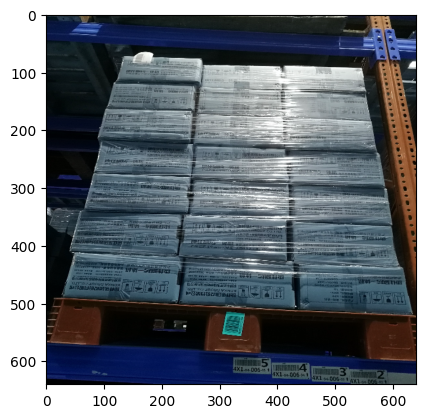

In [ ]:
n = 10
image_id = sample_lscd_image_train_df['image_id'].tolist()[n]
image_df = sample_lscd_image_train_df.query("image_id==@image_id")

image_suffix = image_df.iloc[1,3]
img_fn = f"images/train2017/{image_suffix}"
print(img_fn)

with zipfile.ZipFile(zip_file_path, 'r') as zip_ref:
  with zip_ref.open(img_fn) as file:
    file_content = file.read()
    image = Image.open(BytesIO(file_content))
    image = np.array(image)
    image = cv2.cvtColor(image, cv2.COLOR_RGB2BGR)
    resized_image = cv2.resize(image, (target_width, target_height))
plt.imshow(resized_image);

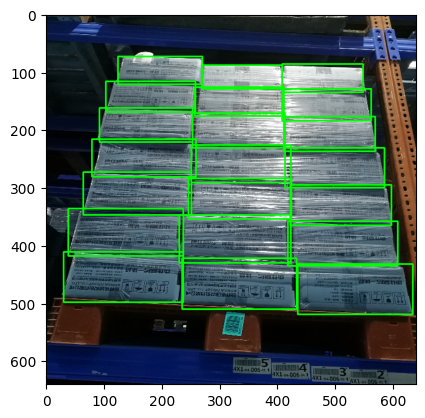

In [ ]:
resized_bboxes = image_df['resized_bbox'].tolist()
for bbox in resized_bboxes:
        x1, y1, x2, y2 = bbox
        cv2.rectangle(resized_image, (x1, y1), (x2, y2), (0, 255, 0), 2)

plt.imshow(resized_image)

# train_df - bboxes

In [70]:
df = sample_lscd_image_train_df.copy()
df.shape

(18080, 9)

In [71]:
df['output_image_fn'] = df.apply(lambda x:
                                 f"{x.zip_file_path.split('/')[-1].split('.')[0]}_{x.image_id}.jpg",
                                 axis=1)
df.shape

(18080, 10)

In [72]:
image_ids = df.image_id.unique().tolist()
print(len(image_ids))

1734


In [73]:
train_image_ids = image_ids[:1550]
test_image_ids = image_ids[1550:1650]
val_image_ids = image_ids[1650:]
print(len(train_image_ids), len(test_image_ids), len(val_image_ids))

1550 100 84


In [74]:
train_df = df.query("image_id==@train_image_ids")
test_df = df.query("image_id==@test_image_ids")
val_df = df.query("image_id==@val_image_ids")
print(train_df.shape, test_df.shape, val_df.shape)

(16162, 10) (1076, 10) (842, 10)


we will use the following function to create annotations according to what Florence-2 expects

In [76]:
def get_image_annotation(gr):
  image_data = {}
  suffix = []
  for row in gr.itertuples():
    coords = [int(s) for s in row.resized_bbox]
    box_suffix = f"box<loc_{coords[0]}><loc_{coords[1]}><loc_{coords[2]}><loc_{coords[3]}>"
    suffix.append(box_suffix)
  suffix = ''.join(suffix)
  image_data['image'] = row.output_image_fn
  image_data['prefix'] = '<OD>'
  image_data['suffix'] = suffix
  return image_data

#### save train_df images:

In [78]:
gr

,height,width,image_id,file_name,segmentation,bbox,file_path,zip_file_path,resized_bbox,output_image_fn
2398,3968,2976,1001,6 (38).jpg,"[[914.2727272727273, 486.3636363636364, 948.36...","[914, 481, 1862, 1686]",images/train2017/6 (38).jpg,./images/LSCD.zip,"[196, 77, 400, 271]",LSCD_1001.jpg
2399,3968,2976,1001,6 (38).jpg,"[[1912.0, 468.1818181818182, 1891.545454545454...","[1855, 454, 2884, 1693]",images/train2017/6 (38).jpg,./images/LSCD.zip,"[398, 73, 620, 273]",LSCD_1001.jpg
2400,3968,2976,1001,6 (38).jpg,"[[1237.0, 1700.0, 1239.2727272727273, 2700.0, ...","[1237, 1695, 2025, 2725]",images/train2017/6 (38).jpg,./images/LSCD.zip,"[266, 273, 435, 439]",LSCD_1001.jpg
2401,3968,2976,1001,6 (38).jpg,"[[450.6363636363636, 1677.2727272727273, 439.2...","[439, 1677, 1227, 2711]",images/train2017/6 (38).jpg,./images/LSCD.zip,"[94, 270, 263, 437]",LSCD_1001.jpg
2402,3968,2976,1001,6 (38).jpg,"[[173.36363636363637, 2702.2727272727275, 227....","[173, 2702, 1000, 3672]",images/train2017/6 (38).jpg,./images/LSCD.zip,"[37, 435, 215, 592]",LSCD_1001.jpg
2403,3968,2976,1001,6 (38).jpg,"[[993.8181818181818, 2697.7272727272725, 1007....","[993, 2697, 1816, 3695]",images/train2017/6 (38).jpg,./images/LSCD.zip,"[213, 435, 390, 595]",LSCD_1001.jpg
2404,3968,2976,1001,6 (38).jpg,"[[1834.7272727272725, 2725.0, 1812.0, 3693.181...","[1812, 2725, 2707, 3768]",images/train2017/6 (38).jpg,./images/LSCD.zip,"[389, 439, 582, 607]",LSCD_1001.jpg
2405,3968,2976,1001,6 (38).jpg,"[[2037.0, 1693.1818181818182, 2030.18181818181...","[2025, 1693, 2896, 2779]",images/train2017/6 (38).jpg,./images/LSCD.zip,"[435, 273, 622, 448]",LSCD_1001.jpg
2406,3968,2976,1001,6 (38).jpg,"[[1862.565217391304, 471.82608695652175, 906.0...","[885, 0, 1897, 493]",images/train2017/6 (38).jpg,./images/LSCD.zip,"[190, 0, 407, 79]",LSCD_1001.jpg
2407,3968,2976,1001,6 (38).jpg,"[[1897.3478260869565, 454.4347826086956, 1893....","[1893, 0, 2945, 454]",images/train2017/6 (38).jpg,./images/LSCD.zip,"[407, 0, 633, 73]",LSCD_1001.jpg


In [87]:
image_directory_path = 'ft-bbox-dataset/train'

annotations = []
grouped = train_df.groupby('output_image_fn')
print(len(grouped))
count = 0
for output_image_fn, gr in grouped:
  try:
    print(output_image_fn, gr.shape)
    image_annotation = get_image_annotation(gr)
    annotations.append(image_annotation)

    # extract image and save it to image folder
    zip_file_path = gr.iloc[0,-3]
    image_file_path = gr.iloc[0,-4]
    with zipfile.ZipFile(zip_file_path, 'r') as zip_ref:
      with zip_ref.open(image_file_path) as file:
          file_content = file.read()
          image = Image.open(BytesIO(file_content))
          resized_pil_image = image.resize((target_width, target_height),
                                          Image.Resampling.LANCZOS)
          resized_pil_image.save(f"{image_directory_path}/{output_image_fn}")
  except:
    print(f"error with {output_image_fn}")

  count+=1
  print(count, len(annotations))
  # break

len(annotations)

1550
LSCD_1001.jpg (22, 10)
1 1
LSCD_1003.jpg (7, 10)
2 2
LSCD_1006.jpg (9, 10)
3 3
LSCD_1007.jpg (12, 10)
4 4
LSCD_1014.jpg (4, 10)
5 5
LSCD_1017.jpg (8, 10)
6 6
LSCD_1022.jpg (8, 10)
7 7
LSCD_1023.jpg (28, 10)
8 8
LSCD_1026.jpg (12, 10)
9 9
LSCD_1028.jpg (4, 10)
10 10
LSCD_1031.jpg (10, 10)
11 11
LSCD_1032.jpg (12, 10)
12 12
LSCD_1034.jpg (15, 10)
13 13
LSCD_1035.jpg (2, 10)
14 14
LSCD_1036.jpg (4, 10)
15 15
LSCD_1037.jpg (17, 10)
16 16
LSCD_104.jpg (10, 10)
17 17
LSCD_1042.jpg (4, 10)
18 18
LSCD_1044.jpg (10, 10)
19 19
LSCD_1045.jpg (12, 10)
20 20
LSCD_1046.jpg (6, 10)
21 21
LSCD_1048.jpg (4, 10)
22 22
LSCD_1059.jpg (12, 10)
23 23
LSCD_106.jpg (4, 10)
24 24
LSCD_1071.jpg (19, 10)
25 25
LSCD_1077.jpg (8, 10)
26 26
LSCD_108.jpg (5, 10)
27 27
LSCD_1080.jpg (5, 10)
28 28
LSCD_1081.jpg (4, 10)
29 29
LSCD_1089.jpg (50, 10)
30 30
LSCD_109.jpg (3, 10)
31 31
LSCD_1094.jpg (13, 10)
32 32
LSCD_1099.jpg (5, 10)
33 33
LSCD_1100.jpg (11, 10)
34 34
LSCD_1101.jpg (20, 10)
35 35
LSCD_1103.jpg (8, 10

1550

let's save annotations in json line format

In [88]:
file_name = 'annotations.jsonl'
file_name = os.path.join(image_directory_path, file_name)
with jsonlines.open(file_name, mode='w') as writer:
    # for annotation in annotations:
    writer.write_all(annotations)

In [89]:
files = os.listdir(image_directory_path)
len(files)

1550

#### save val_df images

In [91]:
val_df

,height,width,image_id,file_name,segmentation,bbox,file_path,zip_file_path,resized_bbox,output_image_fn
17238,4344,5792,6359,y (107).jpg,"[[1308.0, 1977.090909090909, 1239.818181818181...","[417, 1945, 1308, 2563]",images/train2017/y (107).jpg,./images/LSCD.zip,"[46, 286, 144, 377]",LSCD_6359.jpg
17239,4344,5792,6359,y (107).jpg,"[[1230.7272727272727, 2568.0, 1139.81818181818...","[280, 2549, 1230, 3236]",images/train2017/y (107).jpg,./images/LSCD.zip,"[30, 375, 135, 476]",LSCD_6359.jpg
17240,4344,5792,6359,y (107).jpg,"[[1208.0, 3390.7272727272725, 1144.36363636363...","[235, 3349, 1208, 3954]",images/train2017/y (107).jpg,./images/LSCD.zip,"[25, 493, 133, 582]",LSCD_6359.jpg
17241,4344,5792,6359,y (107).jpg,"[[1230.7272727272727, 2554.3636363636365, 1139...","[1139, 2554, 2062, 3245]",images/train2017/y (107).jpg,./images/LSCD.zip,"[125, 376, 227, 478]",LSCD_6359.jpg
17242,4344,5792,6359,y (107).jpg,"[[2058.0, 2563.4545454545455, 2017.09090909090...","[2017, 2563, 2876, 3272]",images/train2017/y (107).jpg,./images/LSCD.zip,"[222, 377, 317, 482]",LSCD_6359.jpg
...,...,...,...,...,...,...,...,...,...,...
18075,3314,2131,6730,2948.jpg,"[[1055.2631578947367, 2523.0, 1939.47368421052...","[1055, 2238, 2086, 3123]",images/train2017/2948.jpg,./images/LSCD.zip,"[316, 432, 626, 603]",LSCD_6730.jpg
18076,3314,2131,6730,2948.jpg,"[[173.1724137931035, 1812.5862068965519, 255.2...","[173, 1807, 1992, 2544]",images/train2017/2948.jpg,./images/LSCD.zip,"[51, 348, 598, 491]",LSCD_6730.jpg
18077,3314,2131,6730,2948.jpg,"[[18.42105263157896, 7.21052631578948, 92.1052...","[18, 7, 2050, 965]",images/train2017/2948.jpg,./images/LSCD.zip,"[5, 1, 615, 186]",LSCD_6730.jpg
18078,3314,2131,6730,2948.jpg,"[[60.526315789473756, 833.5263157894736, 0.0, ...","[0, 833, 1007, 1828]",images/train2017/2948.jpg,./images/LSCD.zip,"[0, 160, 302, 353]",LSCD_6730.jpg


In [96]:
image_directory_path = 'ft-bbox-dataset/val'

annotations = []
grouped = val_df.groupby('output_image_fn')
print(len(grouped))
count = 0
for output_image_fn, gr in grouped:
  try:
    print(output_image_fn, gr.shape)
    image_annotation = get_image_annotation(gr)
    annotations.append(image_annotation)

    # extract image and save it to image folder
    zip_file_path = gr.iloc[0,-3]
    image_file_path = gr.iloc[0,-4]
    with zipfile.ZipFile(zip_file_path, 'r') as zip_ref:
      with zip_ref.open(image_file_path) as file:
          file_content = file.read()
          image = Image.open(BytesIO(file_content))
          resized_pil_image = image.resize((target_width, target_height),
                                          Image.Resampling.LANCZOS)
          resized_pil_image.save(f"{image_directory_path}/{output_image_fn}")
  except:
    print(f"error with {output_image_fn}")
  count+=1
  print(count, len(annotations))
    # break

len(annotations)

84
LSCD_6359.jpg (27, 10)
1 1
LSCD_6365.jpg (3, 10)
2 2
LSCD_6367.jpg (20, 10)
3 3
LSCD_6369.jpg (13, 10)
4 4
LSCD_6373.jpg (4, 10)
5 5
LSCD_6376.jpg (2, 10)
6 6
LSCD_6378.jpg (3, 10)
7 7
LSCD_6379.jpg (2, 10)
8 8
LSCD_6385.jpg (7, 10)
9 9
LSCD_6394.jpg (4, 10)
10 10
LSCD_6402.jpg (11, 10)
11 11
LSCD_6403.jpg (6, 10)
12 12
LSCD_6408.jpg (11, 10)
13 13
LSCD_6415.jpg (17, 10)
14 14
LSCD_6419.jpg (8, 10)
15 15
LSCD_6421.jpg (3, 10)
16 16
LSCD_6422.jpg (14, 10)
17 17
LSCD_6428.jpg (6, 10)
18 18
LSCD_6429.jpg (10, 10)
19 19
LSCD_6430.jpg (4, 10)
20 20
LSCD_6436.jpg (12, 10)
21 21
LSCD_6442.jpg (12, 10)
22 22
LSCD_6460.jpg (18, 10)
23 23
LSCD_6461.jpg (4, 10)
24 24
LSCD_6468.jpg (6, 10)
25 25
LSCD_6469.jpg (5, 10)
26 26
LSCD_6471.jpg (9, 10)
27 27
LSCD_6474.jpg (6, 10)
28 28
LSCD_6484.jpg (9, 10)
29 29
LSCD_6490.jpg (15, 10)
30 30
LSCD_6501.jpg (6, 10)
31 31
LSCD_6512.jpg (1, 10)
32 32
LSCD_6515.jpg (11, 10)
33 33
LSCD_6517.jpg (4, 10)
34 34
LSCD_6524.jpg (12, 10)
35 35
LSCD_6525.jpg (16, 10

84

In [97]:
file_name = 'annotations.jsonl'
file_name = os.path.join(image_directory_path, file_name)
with jsonlines.open(file_name, mode='w') as writer:
    # for annotation in annotations:
    writer.write_all(annotations)

In [98]:
files = os.listdir(image_directory_path)
len(files)

85

#### save test_df images

In [99]:
image_directory_path = 'ft-bbox-dataset/test'

annotations = []
grouped = test_df.groupby('output_image_fn')
print(len(grouped))
count = 0
for output_image_fn, gr in grouped:
  try:
    print(output_image_fn, gr.shape)
    image_annotation = get_image_annotation(gr)
    annotations.append(image_annotation)

    # extract image and save it to image folder
    zip_file_path = gr.iloc[0,-3]
    image_file_path = gr.iloc[0,-4]
    with zipfile.ZipFile(zip_file_path, 'r') as zip_ref:
      with zip_ref.open(image_file_path) as file:
          file_content = file.read()
          image = Image.open(BytesIO(file_content))
          resized_pil_image = image.resize((target_width, target_height),
                                            Image.Resampling.LANCZOS)
          resized_pil_image.save(f"{image_directory_path}/{output_image_fn}")
  except:
    print(f"error with {output_image_fn}")
  count+=1
  print(count, len(annotations))

len(annotations)

100
LSCD_6003.jpg (16, 10)
1 1
LSCD_6006.jpg (31, 10)
2 2
LSCD_6010.jpg (35, 10)
3 3
LSCD_6012.jpg (5, 10)
4 4
LSCD_6017.jpg (8, 10)
5 5
LSCD_6020.jpg (20, 10)
6 6
LSCD_6021.jpg (11, 10)
7 7
LSCD_6026.jpg (5, 10)
8 8
LSCD_6039.jpg (20, 10)
9 9
LSCD_6041.jpg (11, 10)
10 10
LSCD_6044.jpg (3, 10)
11 11
LSCD_6045.jpg (7, 10)
12 12
LSCD_6048.jpg (14, 10)
13 13
LSCD_6050.jpg (6, 10)
14 14
LSCD_6052.jpg (16, 10)
15 15
LSCD_6059.jpg (5, 10)
16 16
LSCD_6063.jpg (19, 10)
17 17
LSCD_6070.jpg (17, 10)
18 18
LSCD_6073.jpg (4, 10)
19 19
LSCD_6080.jpg (7, 10)
20 20
LSCD_6081.jpg (14, 10)
21 21
LSCD_6087.jpg (5, 10)
22 22
LSCD_6090.jpg (13, 10)
23 23
LSCD_6092.jpg (21, 10)
24 24
LSCD_6094.jpg (11, 10)
25 25
LSCD_6095.jpg (4, 10)
26 26
LSCD_6096.jpg (4, 10)
27 27
LSCD_6097.jpg (8, 10)
28 28
LSCD_6102.jpg (2, 10)
29 29
LSCD_6107.jpg (3, 10)
30 30
LSCD_6108.jpg (10, 10)
31 31
LSCD_6110.jpg (4, 10)
32 32
LSCD_6116.jpg (21, 10)
33 33
LSCD_6121.jpg (11, 10)
34 34
LSCD_6123.jpg (33, 10)
35 35
LSCD_6126.jpg (

100

In [100]:
file_name = 'annotations.jsonl'
file_name = os.path.join(image_directory_path, file_name)
with jsonlines.open(file_name, mode='w') as writer:
    # for annotation in annotations:
    writer.write_all(annotations)

In [101]:
files = os.listdir(image_directory_path)
len(files)

101

# OSCD

In [ ]:
zip_file_path = './images/OSCD.zip'
with zipfile.ZipFile(zip_file_path, 'r') as zip_ref:
    # Extract the list of filenames
    oscd_filenames = zip_ref.namelist()

oscd_fn_df = pd.DataFrame(oscd_filenames,
                          columns = ['file_name'])
oscd_fn_df.shape

(25212, 1)

In [ ]:
file_name = 'coco_carton/oneclass_carton/annotations/instances_train2017.json'
zip_file_path = './images/OSCD.zip'
with zipfile.ZipFile(zip_file_path, 'r') as zip_ref:
    with zip_ref.open(file_name) as file:
        file_content = file.read()
        file_text = file_content.decode('utf-8')

json_data = json.loads(file_text)


oscd_image_train_df = pd.DataFrame(json_data['images'])
oscd_annot_train_df = pd.DataFrame(json_data['annotations'])

oscd_image_train_df.shape, oscd_annot_train_df.shape

((7401, 4), (148568, 7))

In [ ]:
oscd_image_train_df.rename(columns={'id' : 'image_id'}, inplace=True)
oscd_image_train_df = oscd_image_train_df.merge(oscd_annot_train_df[['image_id',
                                                        'segmentation',
                                                                     'bbox']],
                    on='image_id')
oscd_image_train_df.shape

(148568, 6)

### create train_df - bboxes

In [ ]:
from random import choices
image_ids = oscd_image_train_df['image_id'].unique()

sample_image_ids = choices(image_ids, k=1000)
len(sample_image_ids)

1000

In [ ]:
sample_oscd_image_train_df = oscd_image_train_df.query("file_name.str.contains('.jpg')\
& image_id==@sample_image_ids")
sample_oscd_image_train_df.shape

(19109, 6)

In [ ]:
sample_oscd_image_train_df['file_path'] = \
sample_oscd_image_train_df['file_name'].apply(lambda x: f"coco_carton/oneclass_carton/images/train2017/{x}")
sample_oscd_image_train_df.shape

<ipython-input-50-37f73f0541ad>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  sample_oscd_image_train_df['file_path'] = \


(19109, 7)

In [ ]:
sample_oscd_image_train_df['zip_file_path'] = './images/OSCD.zip'

<ipython-input-51-5213e2110175>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  sample_oscd_image_train_df['zip_file_path'] = './images/OSCD.zip'


In [ ]:
sample_oscd_image_train_df['bbox'] = \
              sample_oscd_image_train_df['bbox'].apply(lambda x:
                                          [int(x[0]),
                                           int(x[1]),
                                           int(x[0]+x[2]),
                                           int(x[1]+x[3])]
                                                     )

<ipython-input-52-2ba6909c25da>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  sample_oscd_image_train_df['bbox'] = \


In [ ]:
target_height, target_width = 640, 640
sample_oscd_image_train_df['resized_bbox'] = \
sample_oscd_image_train_df.apply(lambda x:
                                          [int(x[5][0]*target_width/x[1]),
                                           int(x[5][1]*target_height/x[0]),
                                           int(x[5][2]*target_width/x[1]),
                                           int(x[5][3]*target_height/x[0])]
                                                     , axis=1)

In [ ]:
sample_oscd_image_train_df

,height,width,image_id,file_name,segmentation,bbox,file_path,zip_file_path
31,500,500,1,net (358).jpg,"[[0, 420, 104, 423, 106, 448, 108, 499, 5, 499...","[0, 420, 108, 499]",coco_carton/oneclass_carton/images/train2017/n...,./images/OSCD.zip
32,500,500,1,net (358).jpg,"[[108, 422, 173, 425, 191, 372, 230, 374, 215,...","[105, 372, 230, 499]",coco_carton/oneclass_carton/images/train2017/n...,./images/OSCD.zip
33,500,500,1,net (358).jpg,"[[327, 439, 325, 500, 220, 499, 218, 425, 239,...","[218, 346, 327, 500]",coco_carton/oneclass_carton/images/train2017/n...,./images/OSCD.zip
34,500,500,1,net (358).jpg,"[[351, 440, 453, 443, 457, 424, 467, 437, 460,...","[342, 424, 467, 499]",coco_carton/oneclass_carton/images/train2017/n...,./images/OSCD.zip
35,500,500,1,net (358).jpg,"[[453, 443, 470, 309, 465, 303, 346, 302, 339,...","[260, 291, 470, 443]",coco_carton/oneclass_carton/images/train2017/n...,./images/OSCD.zip
...,...,...,...,...,...,...,...,...
148456,225,300,7397,net (5314).jpg,"[[106, 164, 109, 196, 197, 191, 196, 158]]","[106, 158, 197, 196]",coco_carton/oneclass_carton/images/train2017/n...,./images/OSCD.zip
148457,225,300,7397,net (5314).jpg,"[[195, 146, 197, 190, 199, 192, 274, 186, 277,...","[195, 146, 277, 192]",coco_carton/oneclass_carton/images/train2017/n...,./images/OSCD.zip
148458,225,300,7397,net (5314).jpg,"[[18, 197, 21, 224, 109, 225, 116, 203, 116, 1...","[18, 193, 116, 225]",coco_carton/oneclass_carton/images/train2017/n...,./images/OSCD.zip
148459,225,300,7397,net (5314).jpg,"[[120, 197, 120, 198, 122, 225, 202, 225, 199,...","[120, 190, 202, 225]",coco_carton/oneclass_carton/images/train2017/n...,./images/OSCD.zip


# LSCD_occlusions
this is the third dataset in SCD collection. We are not using it at the moment

In [ ]:
zip_file_path = './images/LSCD_occlusions.zip'
with zipfile.ZipFile(zip_file_path, 'r') as zip_ref:
    # Extract the list of filenames
    lscd_occlusions_filenames = zip_ref.namelist()
lscd_occl_fn_df = pd.DataFrame(lscd_filenames,
                          columns = ['file_name'])

lscd_occl_fn_df.shape

(7741, 1)

In [ ]:
lscd_occl_fn_df.sample(20)

,file_name
5952,images/train2017/l (126).jpg
7289,images/val2017/4 (16).jpg
6577,images/train2017/y (130).jpg
5198,images/train2017/IMG_20191125_124222.jpg
6804,images/val2017/1009.jpg
5893,images/train2017/IMG_20200917_142751.jpg
7692,images/val2017/w (232).jpg
1269,images/train2017/2 (176).jpg
4657,images/train2017/602.jpg
2823,images/train2017/3 (359).jpg


In [ ]:
file_name = 'annotations/instances_train2017.json'

with zipfile.ZipFile(zip_file_path, 'r') as zip_ref:
    with zip_ref.open(file_name) as file:
        file_content = file.read()
        file_text = file_content.decode('utf-8')

json_data = json.loads(file_text)

lscd_occl_image_train_df = pd.DataFrame(json_data['images'])
lscd_occl_annot_train_df = pd.DataFrame(json_data['annotations'])

lscd_occl_image_train_df.shape, lscd_occl_annot_train_df.shape

((6735, 4), (71480, 7))

In [ ]:
lscd_occl_image_train_df.rename(columns={'id' : 'image_id'}, inplace=True)
lscd_occl_image_train_df = lscd_occl_image_train_df.merge(lscd_occl_annot_train_df[['image_id',
                                                        'segmentation']],
                    on='image_id')
lscd_occl_image_train_df.shape

(71480, 5)

In [ ]:
from random import choices
image_ids = lscd_occl_image_train_df['image_id'].unique()

sample_image_ids = choices(image_ids, k=1000)
len(sample_image_ids)

1000

In [ ]:
sample_lscd_occl_image_train_df = lscd_occl_image_train_df.query("file_name.str.contains('.jpg')\
& image_id==@sample_image_ids")
sample_lscd_occl_image_train_df.shape

(9817, 5)

In [ ]:
sample_lscd_occl_image_train_df['file_path'] = \
sample_lscd_occl_image_train_df['file_name'].apply(lambda x: f"images/train2017/{x}")
sample_lscd_occl_image_train_df.shape


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


(9817, 6)

In [ ]:
sample_lscd_occl_image_train_df['zip_file_path']='./images/LSCD_occlusions.zip'


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


In [ ]:
with zipfile.ZipFile(zip_file_path, 'r') as zip_ref:
  for row in sample_lscd_occl_image_train_df.itertuples():

    with zip_ref.open(row.file_path) as file:
          file_content = file.read()
          image = Image.open(BytesIO(file_content))
          break

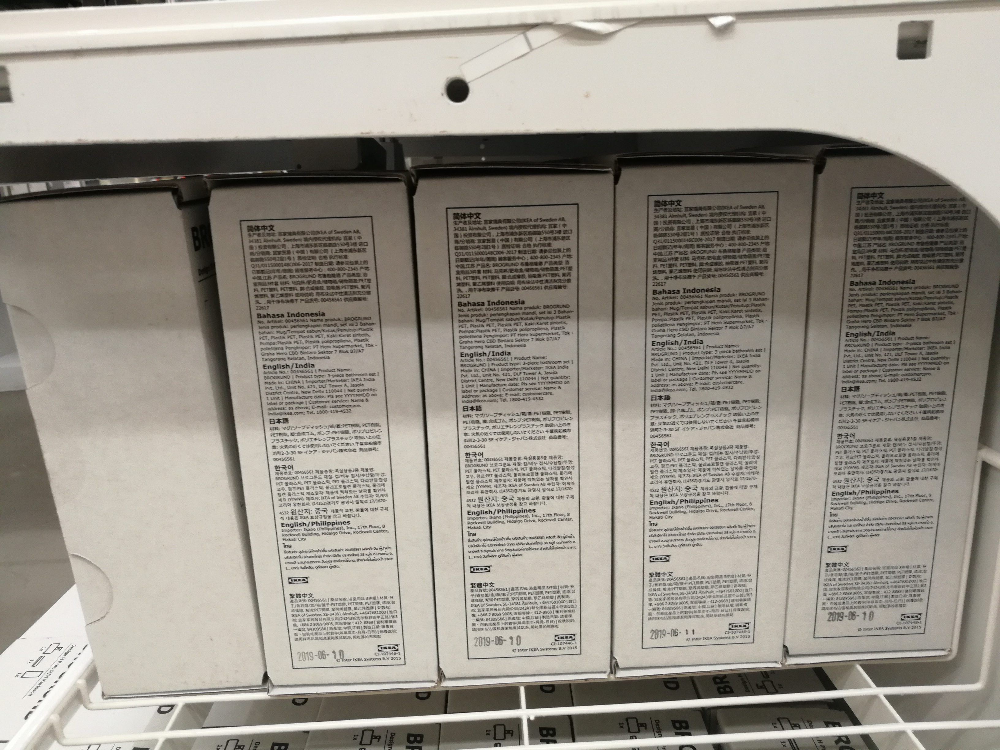

In [ ]:
image